# Annotation
## Virus transcripts check

In [3]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
#import scarches as sca
import urllib.request

In [5]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
sc.set_figure_params(figsize=(5, 5))
sc.settings.set_figure_params(dpi=60) 

In [6]:
l1 = sc.read_h5ad(
    filename="L1_clustering.h5ad"
)
l2 = sc.read_h5ad(
    filename="L2_clustering.h5ad"
)

In [7]:
virus_genes = {'TRV': ['TRV-PDS3-transcript', 'pVS1-StaA', 'pVS1-RepA', 'TRV-KanR', 'TRV-dGAG-transcript']}

marker_genes_in_data_l1 = dict()
for ct, markers in virus_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l1.var.index:
            markers_found.append(marker)
    marker_genes_in_data_l1[ct] = markers_found

marker_genes_in_data_l2 = dict()
for ct, markers in virus_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l2.var.index:
            markers_found.append(marker)
    marker_genes_in_data_l2[ct] = markers_found

In [8]:
print(marker_genes_in_data_l1) # yay! virus transcripts are present in L1
print(marker_genes_in_data_l2) # yay! virus transcripts are not present in L2

{'TRV': ['TRV-PDS3-transcript']}
{'TRV': []}


In [9]:
l1.layers["counts"] = l1.X
l1.X = l1.layers["scran_normalization"]

l2.layers["counts"] = l2.X
l2.X = l2.layers["scran_normalization"]

In [10]:
l1.var["highly_variable"] = l1.var["highly_deviant"]
l2.var["highly_variable"] = l2.var["highly_deviant"]

sc.tl.pca(l1, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l1)
sc.tl.umap(l1)

sc.tl.pca(l2, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l2)
sc.tl.umap(l2)

/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


In [12]:
l1.write("L1_annotation.h5ad")
l2.write("L2_annotation.h5ad")

## Virus-induced silencing of PDS3 (AT4G14210)

In [13]:
print(l1[l1[: , 'TRV-PDS3-transcript'].X > 0, :].n_obs) # count infected cells

91


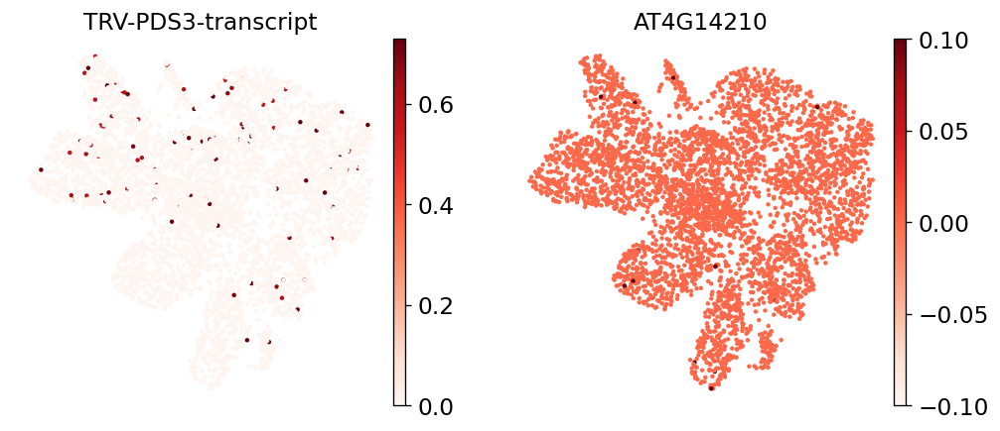

In [14]:
sc.pl.umap(
        l1,
        color=['TRV-PDS3-transcript', 'AT4G14210'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

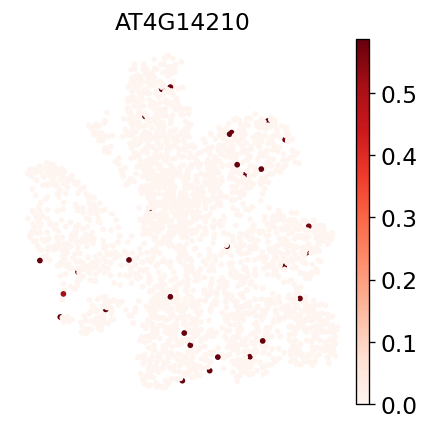

In [15]:
sc.pl.umap(
        l2,
        color=['AT4G14210'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

## Marker genes

In [16]:
l1 = sc.read_h5ad(
    filename="L1_annotation.h5ad"
)
l2 = sc.read_h5ad(
    filename="L2_annotation.h5ad"
)

In [17]:
marker_genes = pd.read_csv('/home/sources/atlases/panel.tsv', sep='\t', skiprows=0)
marker_genes = marker_genes[~marker_genes['Cell type'].isna()]
marker_genes = marker_genes[['TAIR', 'Cell type']].drop_duplicates()

In [18]:
marker_genes

,TAIR,Cell type
0,AT5G38420,mesophyll
1,AT1G62360,meristem
2,AT4G08150,meristem
3,AT1G23380,meristem
4,AT1G70510,meristem
...,...,...
217,AT4G090301,vasculature
218,AT4G19200,vasculature
219,AT2G466501,vasculature
220,AT5G02380,vasculature


In [19]:
marker_genes['Cell type'].unique()

array(['mesophyll', 'meristem', 'epidermis', 'proliferating cell',
       'guard cell', 'vasculature', 'phloem', 'xylem',
       'tracheary element', 'companion cell', 'sieve element',
       'pavement cell', 'S phase', 'G2/M phase', 'bundle sheath',
       'phloem parenchyma', 'cambium', 'myrosin idioblasts'], dtype=object)

In [20]:
marker_genes = {
    key: list(value)
    for key, value in marker_genes.groupby('Cell type')['TAIR']
}

In [21]:
marker_genes_in_data_l1 = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l1.var.index:
            markers_found.append(marker)
    if len(markers_found) > 0:
        marker_genes_in_data_l1[ct] = markers_found

marker_genes_in_data_l2 = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l2.var.index:
            markers_found.append(marker)
    if len(markers_found) > 0:
        marker_genes_in_data_l2[ct] = markers_found

In [22]:
l1.layers["counts"] = l1.X
l1.X = l1.layers["scran_normalization"]
l1.var["highly_variable"] = l1.var["highly_deviant"]
sc.tl.pca(l1, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l1)
sc.tl.umap(l1)

l2.layers["counts"] = l2.X
l2.X = l2.layers["scran_normalization"]
l2.var["highly_variable"] = l2.var["highly_deviant"]
sc.tl.pca(l2, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l2)
sc.tl.umap(l2)

/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


In [23]:
cell_cts = ['mesophyll', 'meristem', 'epidermis', 'proliferating cell',
       'guard cell', 'vasculature', 'phloem', 'xylem',
       'tracheary element', 'companion cell', 'sieve element',
       'pavement cell', 'S phase', 'G2/M phase', 'bundle sheath',
       'phloem parenchyma', 'cambium', 'myrosin idioblasts']

S PHASE:


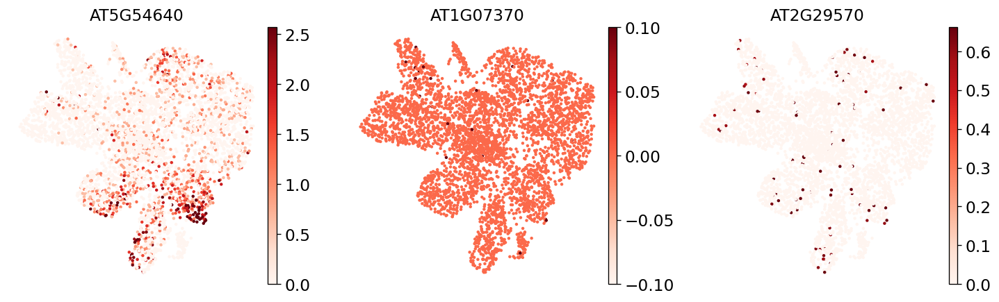





COMPANION CELL:


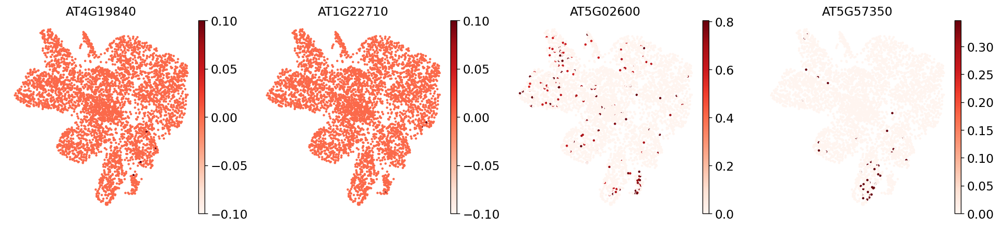





EPIDERMIS:


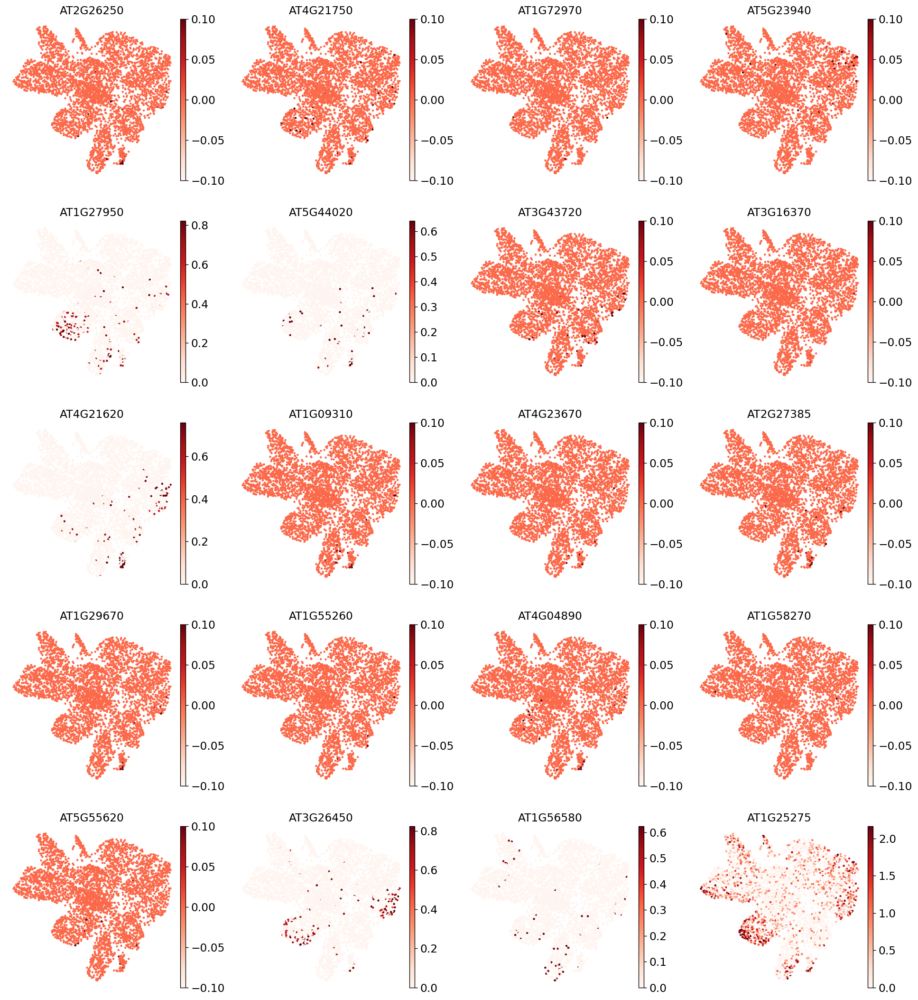





GUARD CELL:


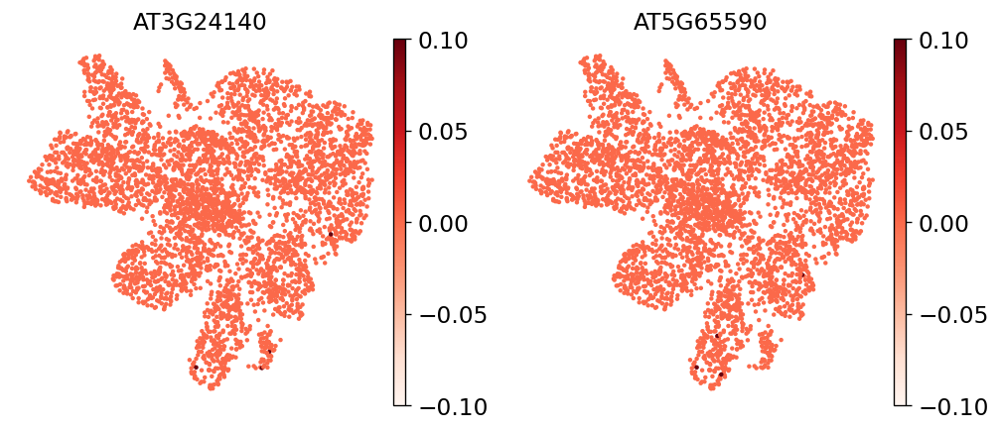





MERISTEM:


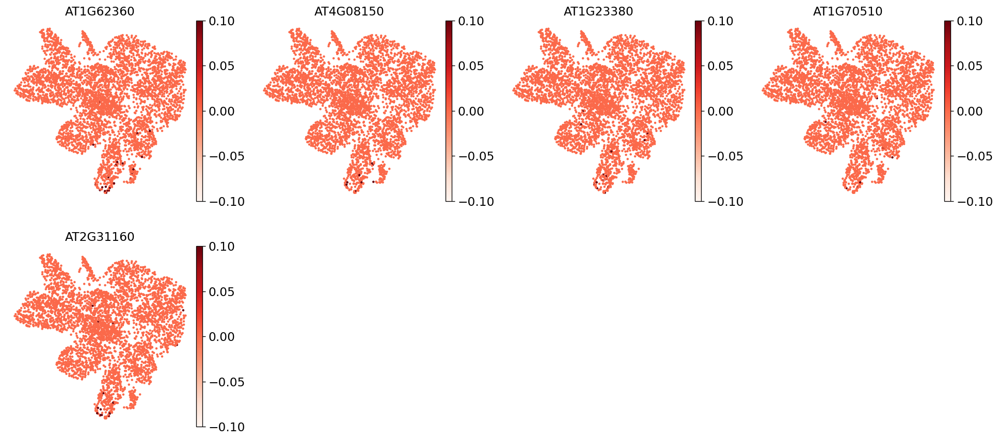





MESOPHYLL:


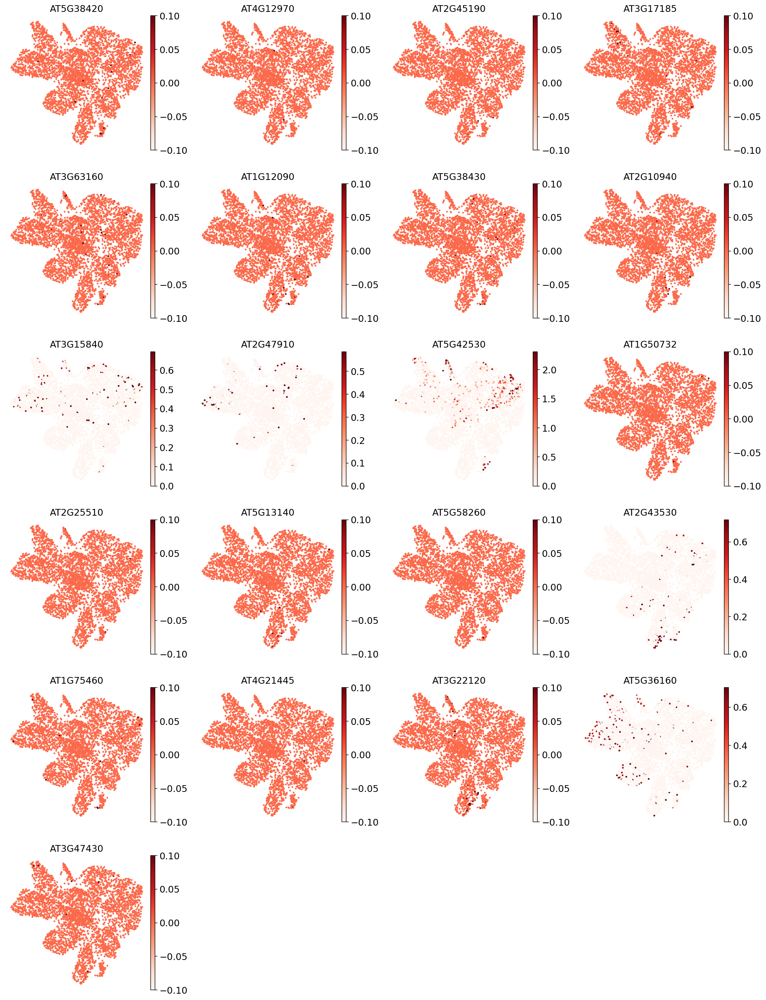





MYROSIN IDIOBLASTS:


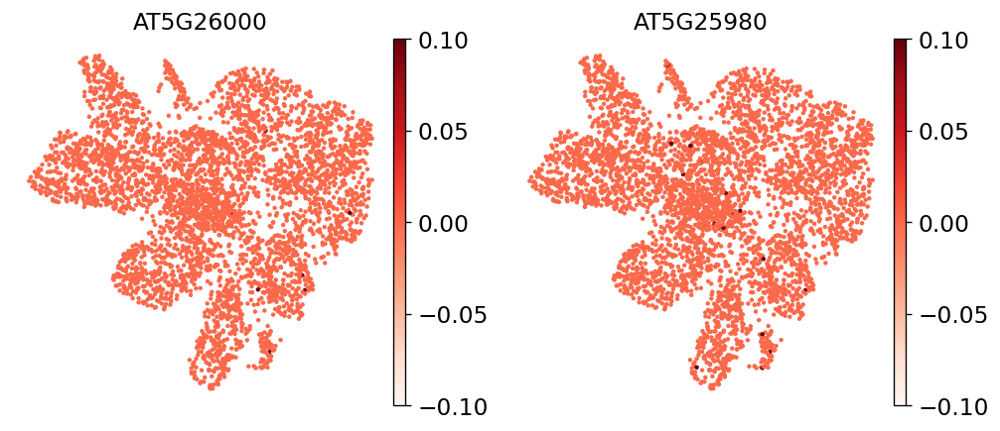





PAVEMENT CELL:


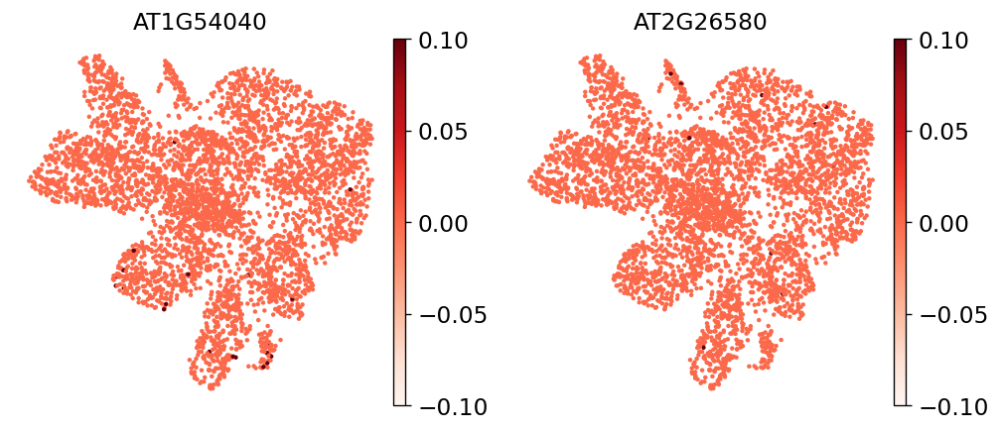





PHLOEM:


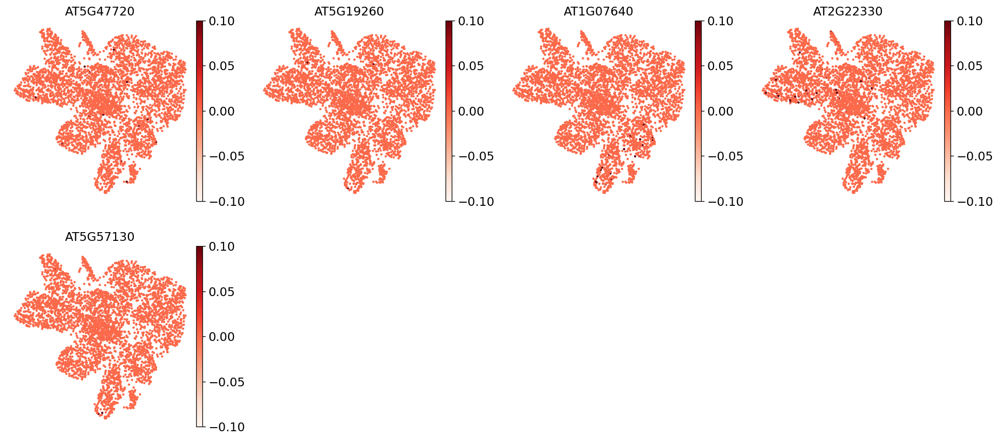





PHLOEM PARENCHYMA:


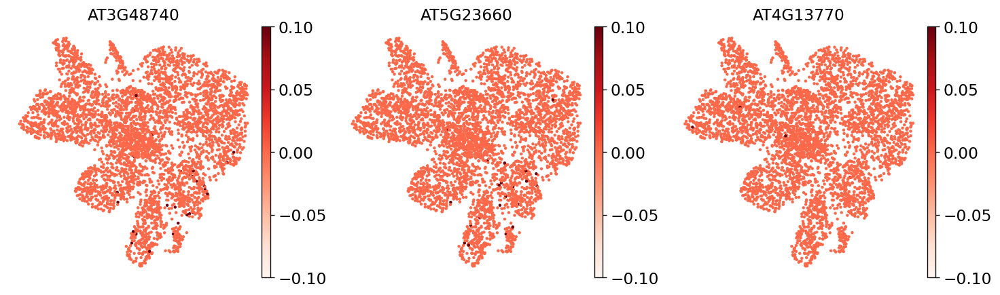





PROLIFERATING CELL:


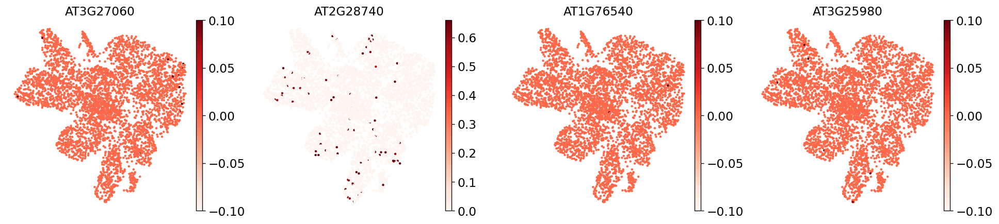





SIEVE ELEMENT:


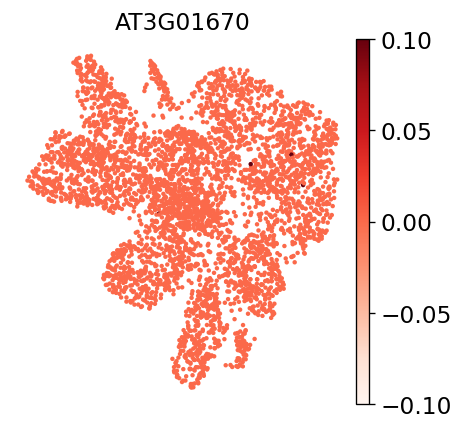





VASCULATURE:


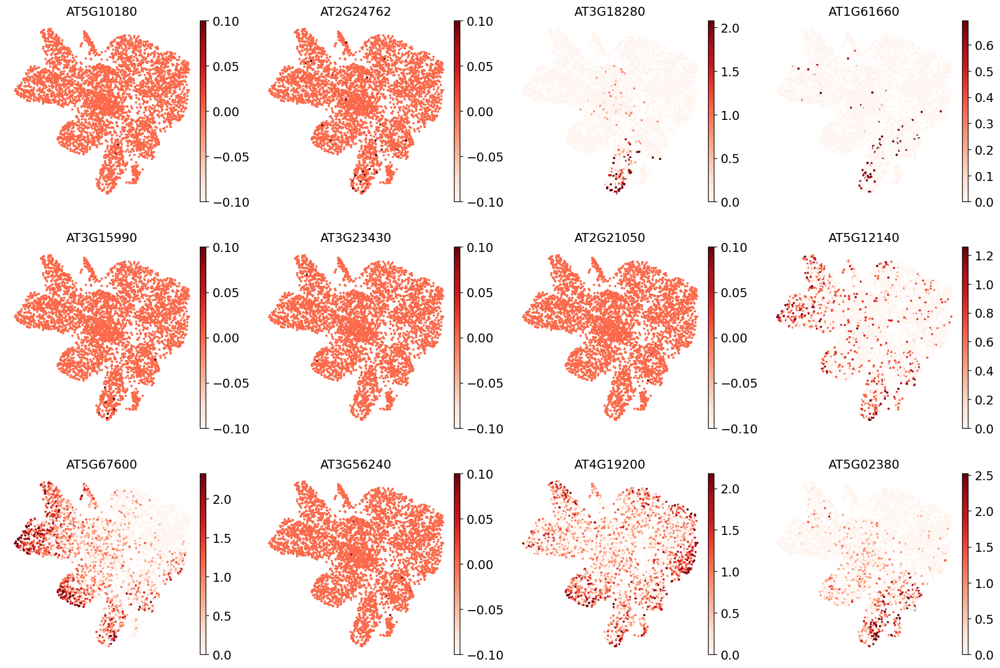





XYLEM:


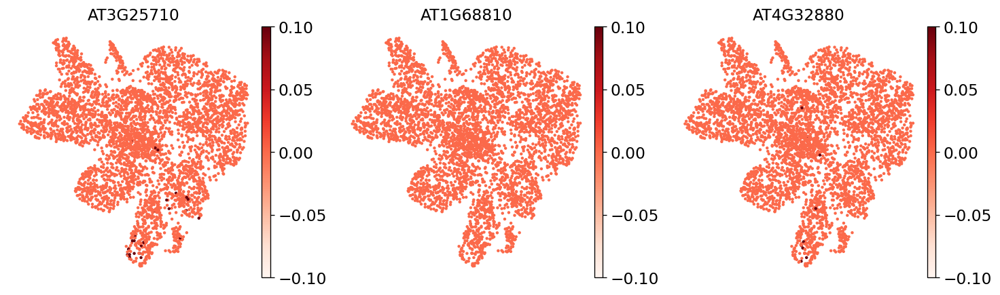

In [24]:
for ct in marker_genes_in_data_l1.keys():
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        l1,
        color=marker_genes_in_data_l1[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

S PHASE:


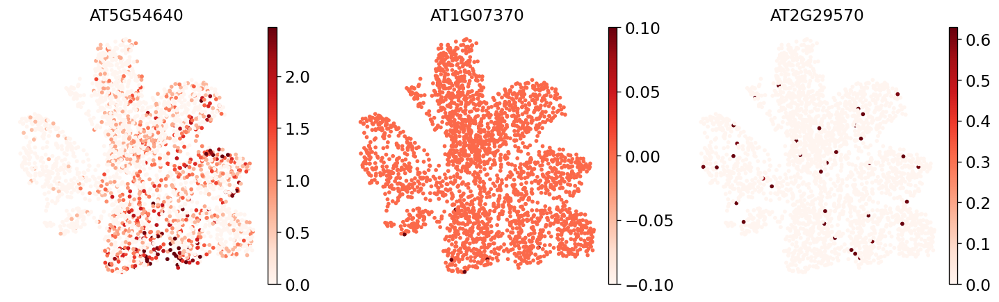





CAMBIUM:


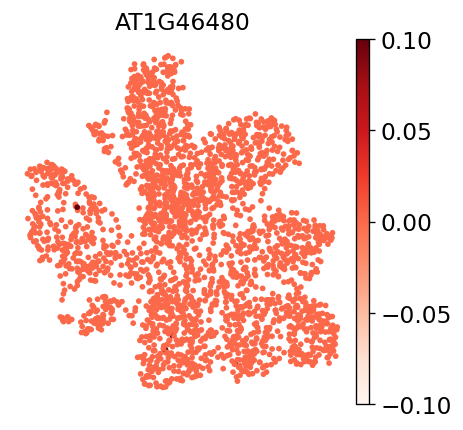





COMPANION CELL:


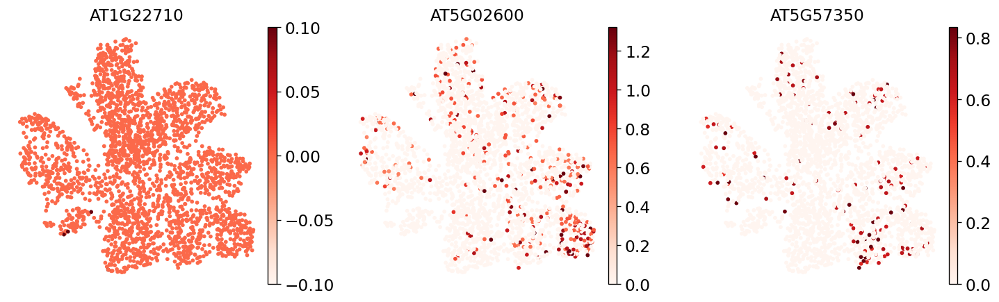





EPIDERMIS:


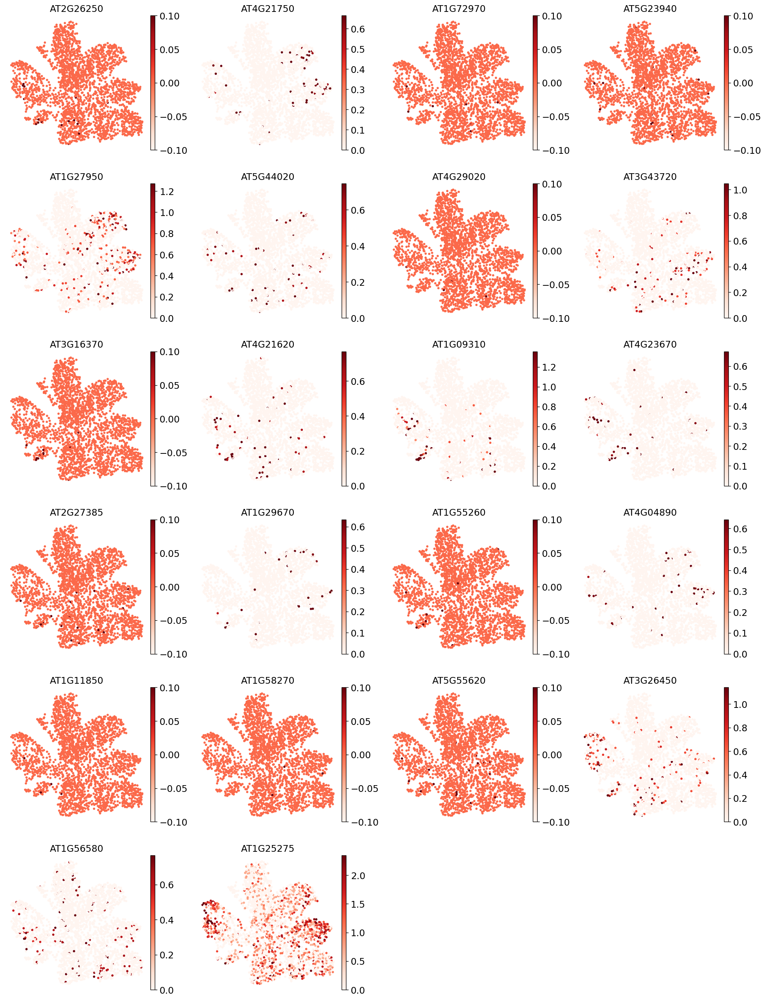





GUARD CELL:


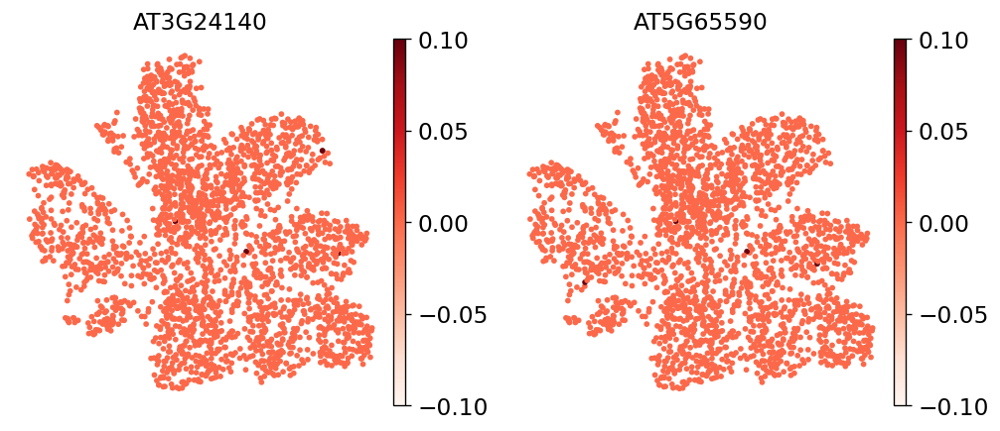





MERISTEM:


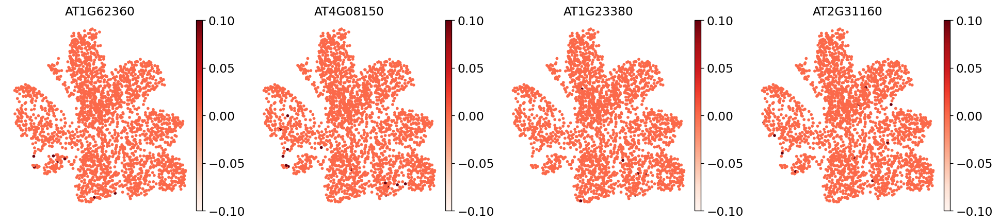





MESOPHYLL:


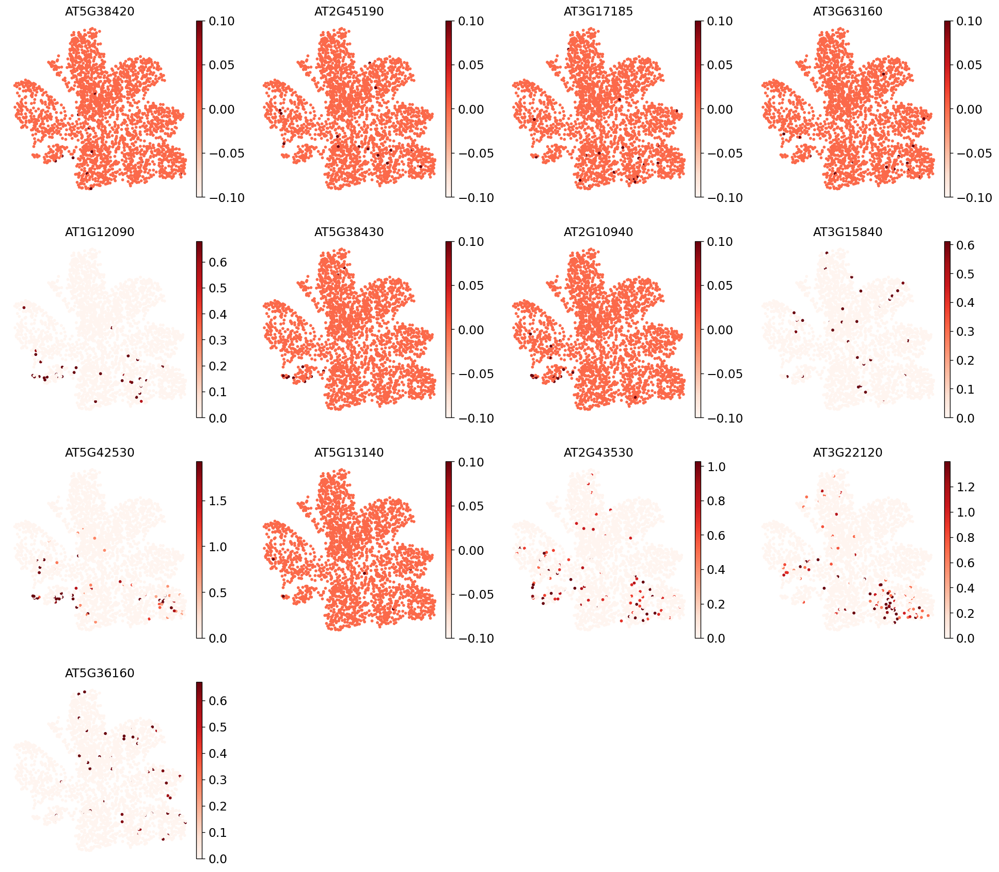





MYROSIN IDIOBLASTS:


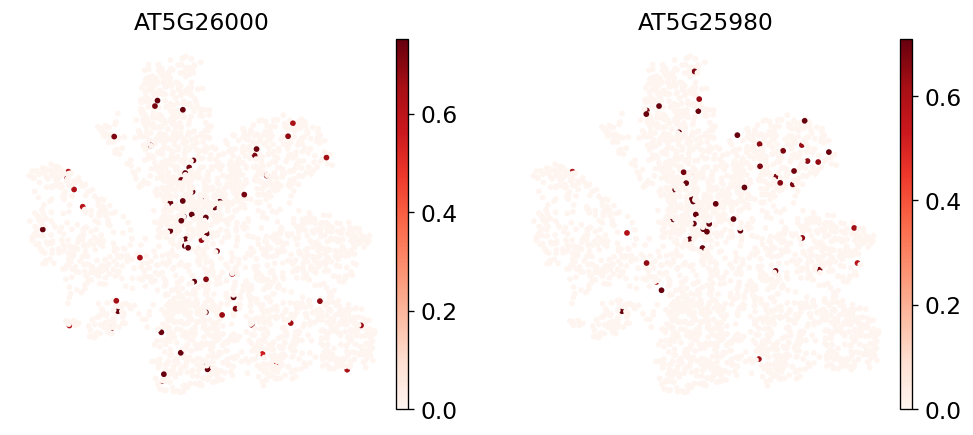





PAVEMENT CELL:


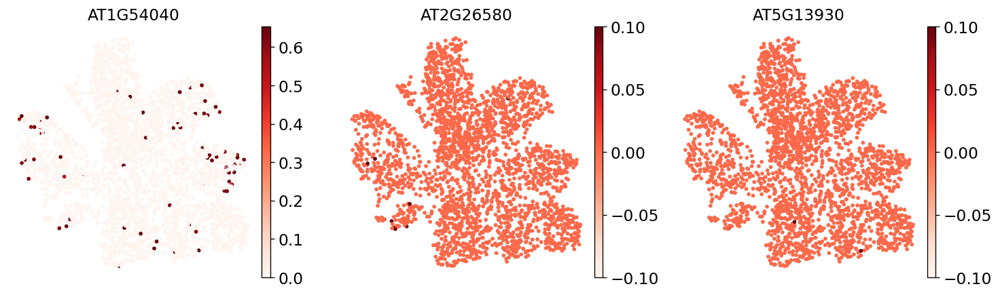





PHLOEM:


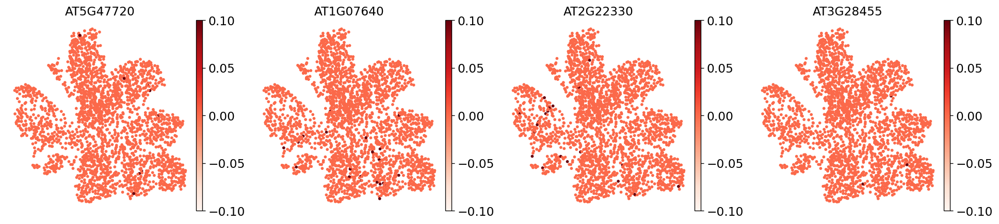





PHLOEM PARENCHYMA:


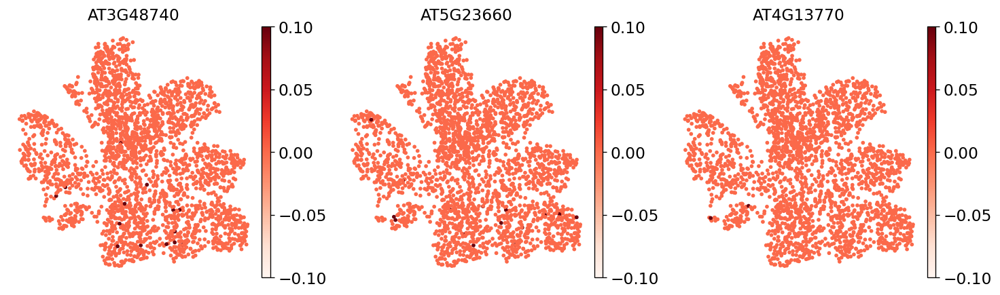





PROLIFERATING CELL:


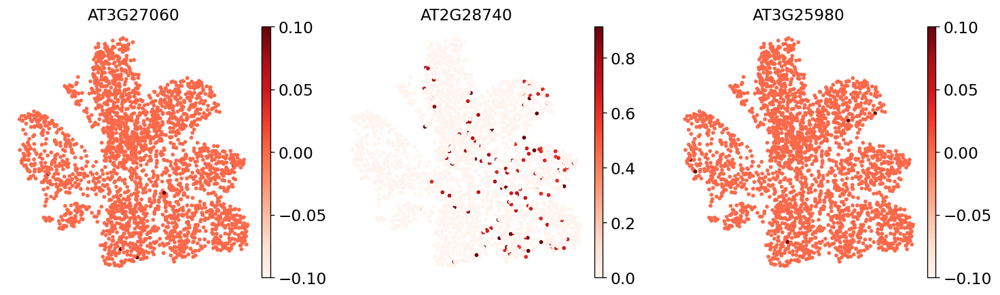





SIEVE ELEMENT:


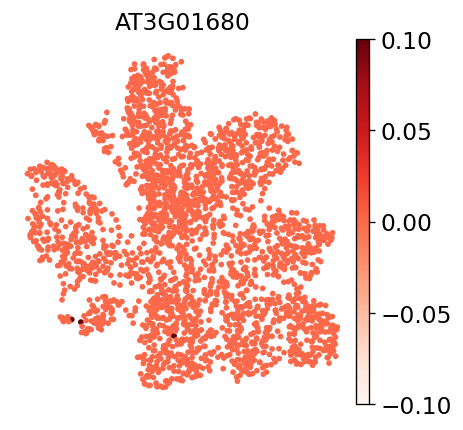





TRACHEARY ELEMENT:


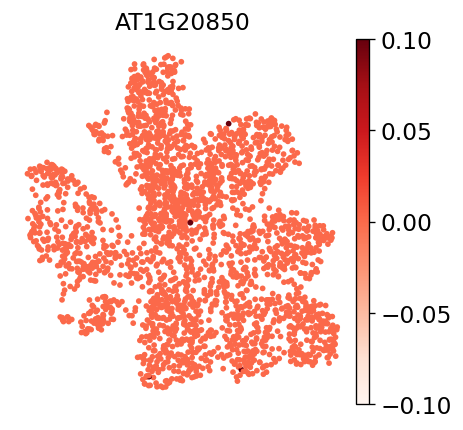





VASCULATURE:


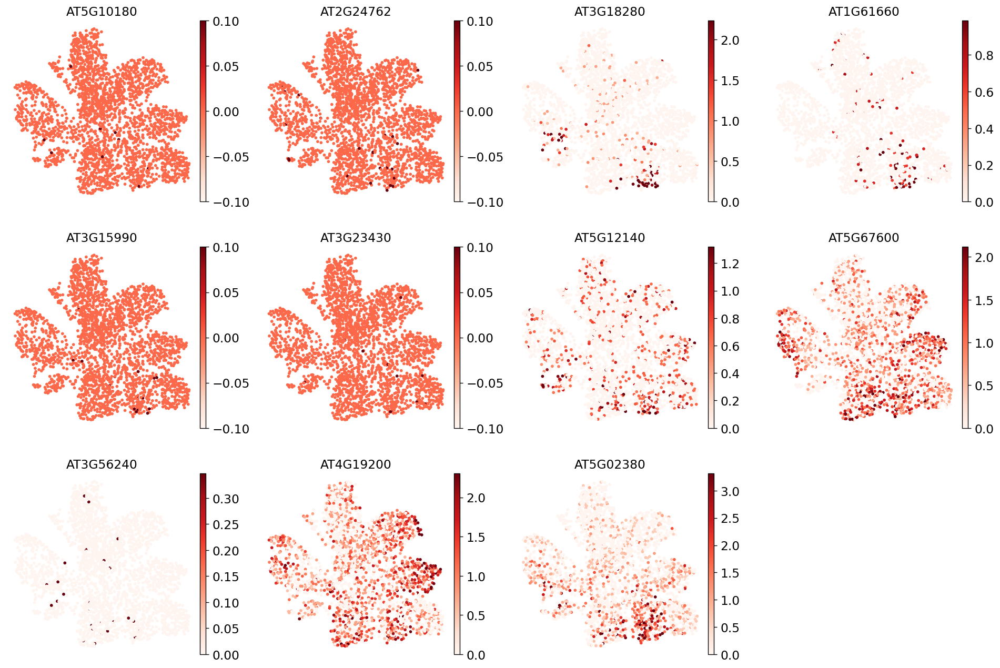





XYLEM:


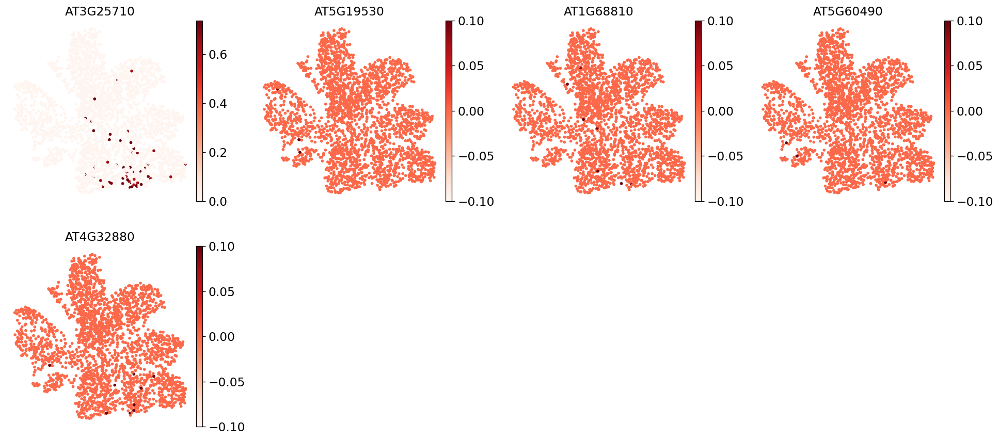

In [25]:
for ct in marker_genes_in_data_l2.keys():
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        l2,
        color=marker_genes_in_data_l2[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

## From clusters to diff expressed genes

In [26]:
sc.tl.rank_genes_groups(
    l1, groupby="leiden_res0_5", method="wilcoxon", key_added="dea_leiden_0_5"
)

sc.tl.rank_genes_groups(
    l2, groupby="leiden_res0_5", method="wilcoxon", key_added="dea_leiden_0_5"
)

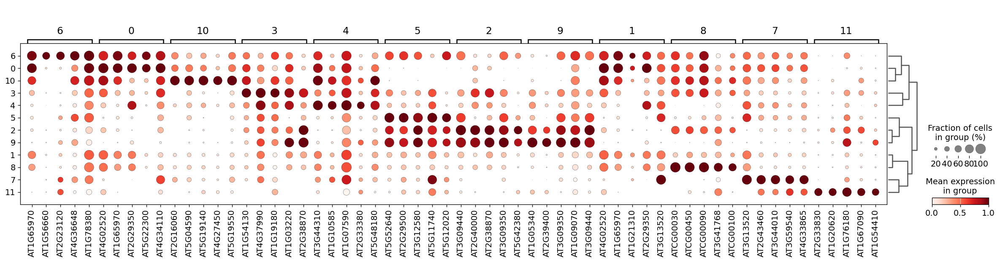

In [27]:
sc.pl.rank_genes_groups_dotplot(
    l1, groupby="leiden_res0_5", standard_scale="var", n_genes=5, key="dea_leiden_0_5"
)

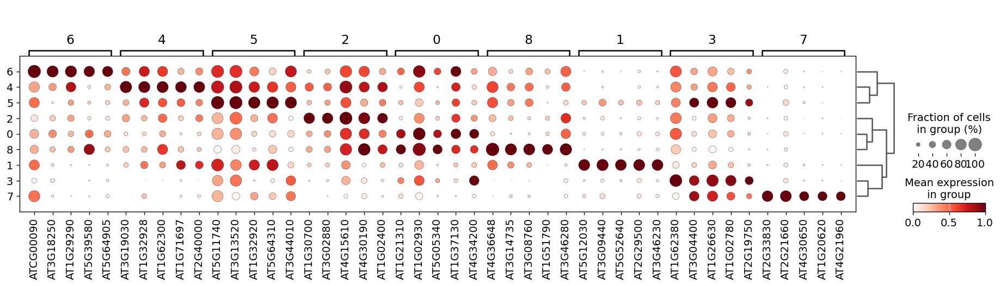

In [28]:
sc.pl.rank_genes_groups_dotplot(
    l2, groupby="leiden_res0_5", standard_scale="var", n_genes=5, key="dea_leiden_0_5"
)

In [29]:
l1.write("L1_annotation.h5ad")
l2.write("L2_annotation.h5ad")

In [30]:
sc.tl.filter_rank_genes_groups(
    l1,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_5",
    key_added="dea_leiden_0_5_filtered",
)

sc.tl.filter_rank_genes_groups(
    l2,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_5",
    key_added="dea_leiden_0_5_filtered",
)

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    l1,
    groupby="leiden_res0_5",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_0_5_filtered",
)

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    l2,
    groupby="leiden_res0_5",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_0_5_filtered",
)

In [33]:
del l1.uns['dea_leiden_0_5_filtered'] # cannot be saved in adata
del l2.uns['dea_leiden_0_5_filtered']

In [34]:
l1 = sc.read_h5ad(
    filename="L1_annotation.h5ad"
)
l2 = sc.read_h5ad(
    filename="L2_annotation.h5ad"
)

In [35]:
cl_annotation_l2 = {
    "0": "Mesophyll / Vascular tissue", 
    "1": "HS-related",
    "2": "Mesophyll / Leaf epidermis",
    "3": "S phase/ G2/M phase",
    "4": "Xylem / Phloem parenchyma",
    "5": "Phloem parenchyma / Vascular tissue", 
    "6": "Xylem", 
    "7": "Leaf pavement cell / Shoot system epidermis", 
    "8": "Bundle sheath"
}

In [36]:
cl_annotation_l1 = {
    "0": "Senescent leaf bundle sheath", 
    "1": "Unknown",
    "2": "Mesophyll",
    "3": "Phloem parenchyma",
    "4": "Unknown",
    "5": "Unknown", 
    "6": "Unknown", 
    "7": "S phase/ G2/M phase", 
    "8": "Unknown",
    "9": "Leaf epidermis",
    "10": "Hypoxia-associated / Leaf guard cell",
    "11": "Unknown" 
}

In [37]:
l2.obs["manual_celltype_annotation"] = l2.obs.leiden_res0_5.map(cl_annotation_l2)
l1.obs["manual_celltype_annotation"] = l1.obs.leiden_res0_5.map(cl_annotation_l1)

In [ ]:
sc.pl.umap(l1, color=["manual_celltype_annotation"], title='L1 manual celltype annotation')

In [ ]:
sc.pl.umap(l1, color=["leiden_res0_5"], title='L1 Leiden')

In [ ]:
sc.pl.umap(l2, color=["manual_celltype_annotation"], title='L2 manual celltype annotation')

In [ ]:
sc.pl.umap(l2, color=["leiden_res0_5"], title='L2 Leiden')

In [42]:
l1.write("L1_annotation.h5ad")
l2.write("L2_annotation.h5ad")